# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset

In [2]:
dataset = get_dataset("../data/processed/*.tfrecord")

INFO:tensorflow:Reading unweighted datasets: ['../data/processed/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['../data/processed/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 100
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.experimental.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [3]:
import tensorflow.compat.v1 as tf
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np

%matplotlib inline

In [4]:
def display_instances(tfrecord):
    '''This function shows an image from the tfrecord with its
       corresponding ground truth bounding boxes and labels.
    '''
    # Variables
    name    = tfrecord['filename']
    img     = tfrecord['image'].numpy()
    img_shape = img.shape
    bboxes   = tfrecord['groundtruth_boxes'].numpy()
    classes = tfrecord['groundtruth_classes'].numpy()
    
    #Display the information of the tfrecord
    print('#########################################TFrecord Information#########################################')
    print('Name of the TFrecord: {}'.format(tfrecord['filename']))
    print('The shape of the image is: {}'.format(img_shape))
    print('The are {} boxes in the image:'.format(len(bboxes)))
    print('The are {} objects in the image:'.format(len(classes)))
    
    _, ax = plt.subplots(1,figsize=(20, 10))
    # color mapping of classes
    colormap = {1: [1, 0, 0], 2: [0, 0, 1], 4: [0, 1, 0]}
    
    for cl, bb in zip(classes, bboxes):
        y1, x1, y2, x2 = bb
        y1 = y1*img_shape[0]
        x1 = x1*img_shape[1]
        y2 = y2*img_shape[0]
        x2 = x2*img_shape[1]
        rec = Rectangle((x1, y1), x2- x1, y2-y1, facecolor='none', edgecolor=colormap[cl])
        ax.add_patch(rec)
        
    # Plot the image with its corresponding bounding boxes
    imgplot = plt.imshow(img)
    plt.show()

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

#########################################TFrecord Information#########################################
Name of the TFrecord: b'segment-10750135302241325253_180_000_200_000_with_camera_labels_21.tfrecord'
The shape of the image is: (1280, 1920, 3)
The are 14 boxes in the image:
The are 14 objects in the image:


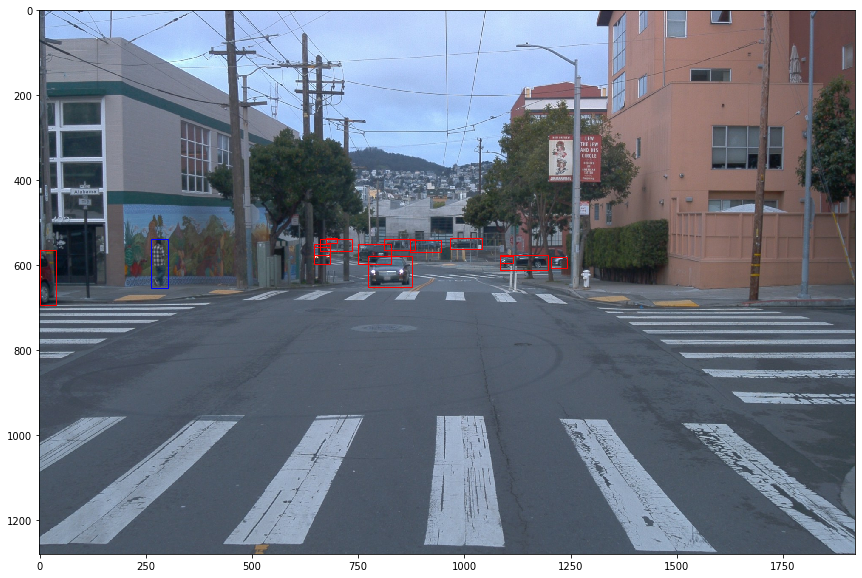

#########################################TFrecord Information#########################################
Name of the TFrecord: b'segment-11379226583756500423_6230_810_6250_810_with_camera_labels_33.tfrecord'
The shape of the image is: (1280, 1920, 3)
The are 2 boxes in the image:
The are 2 objects in the image:


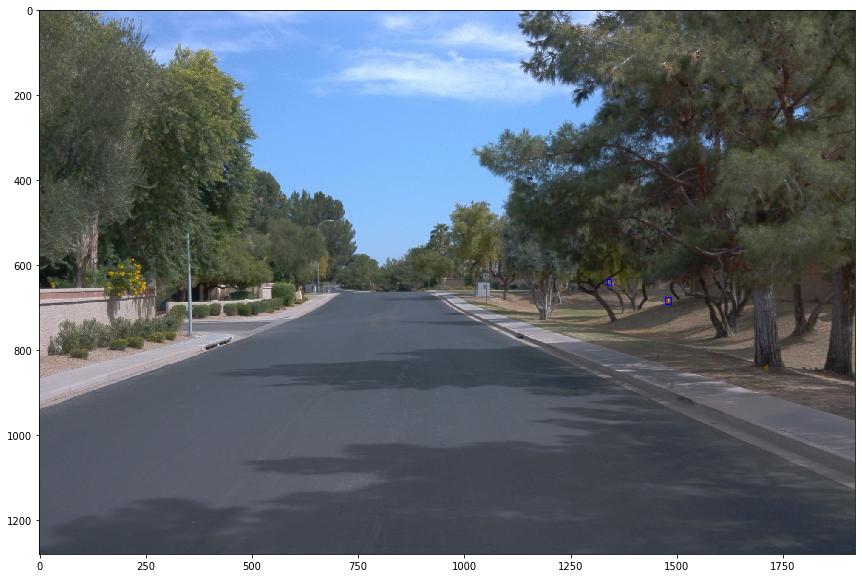

#########################################TFrecord Information#########################################
Name of the TFrecord: b'segment-10017090168044687777_6380_000_6400_000_with_camera_labels_0.tfrecord'
The shape of the image is: (1280, 1920, 3)
The are 5 boxes in the image:
The are 5 objects in the image:


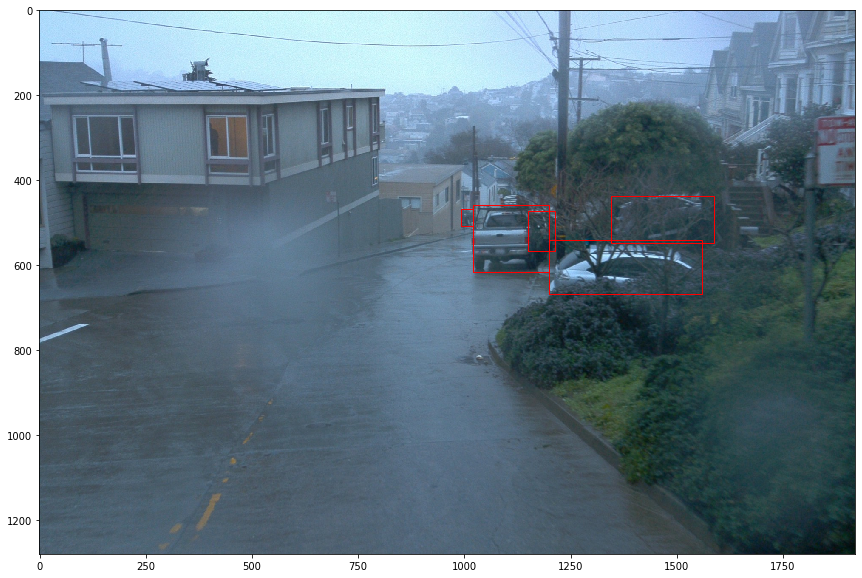

#########################################TFrecord Information#########################################
Name of the TFrecord: b'segment-10500357041547037089_1474_800_1494_800_with_camera_labels_19.tfrecord'
The shape of the image is: (1280, 1920, 3)
The are 28 boxes in the image:
The are 28 objects in the image:


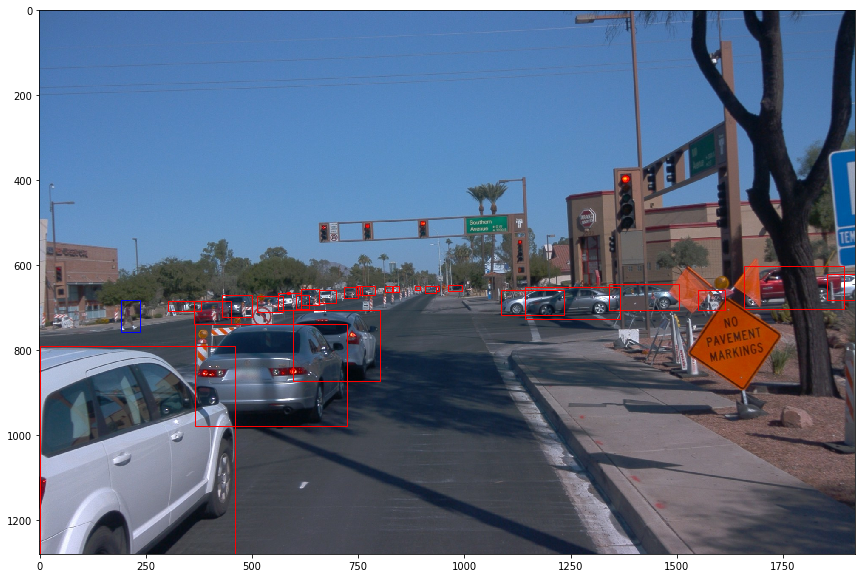

#########################################TFrecord Information#########################################
Name of the TFrecord: b'segment-10975280749486260148_940_000_960_000_with_camera_labels_23.tfrecord'
The shape of the image is: (1280, 1920, 3)
The are 7 boxes in the image:
The are 7 objects in the image:


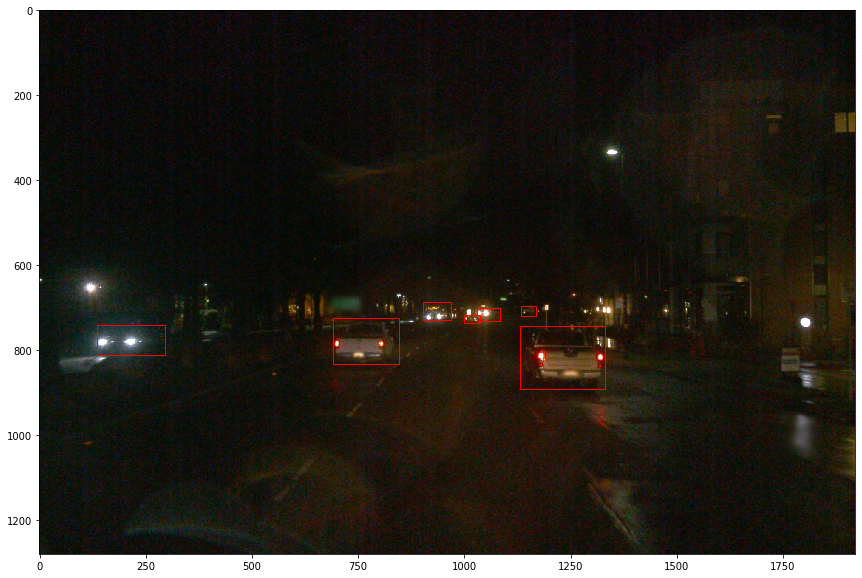

#########################################TFrecord Information#########################################
Name of the TFrecord: b'segment-11119453952284076633_1369_940_1389_940_with_camera_labels_31.tfrecord'
The shape of the image is: (1280, 1920, 3)
The are 8 boxes in the image:
The are 8 objects in the image:


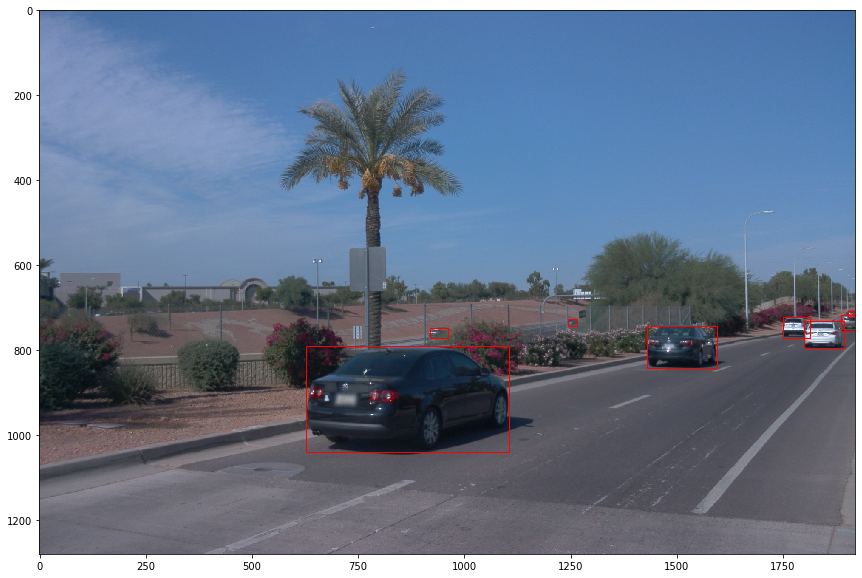

#########################################TFrecord Information#########################################
Name of the TFrecord: b'segment-10235335145367115211_5420_000_5440_000_with_camera_labels_12.tfrecord'
The shape of the image is: (1280, 1920, 3)
The are 15 boxes in the image:
The are 15 objects in the image:


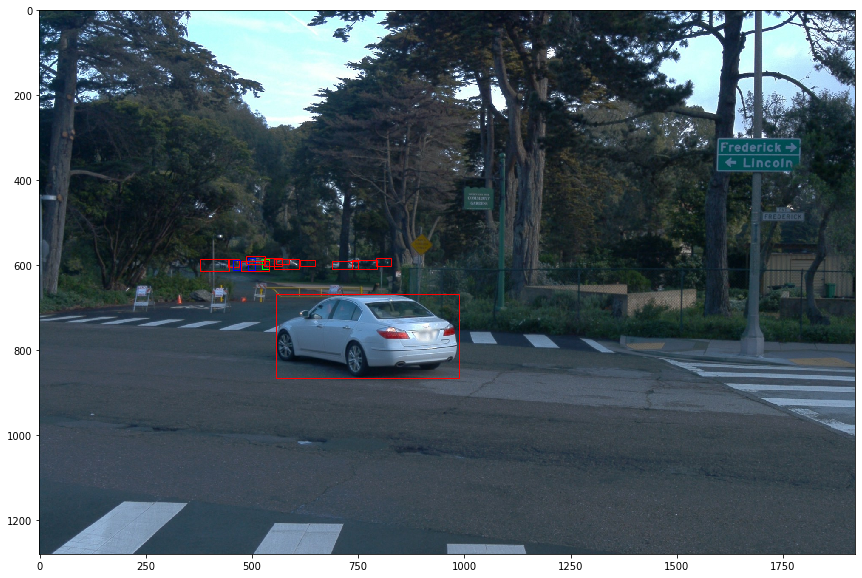

#########################################TFrecord Information#########################################
Name of the TFrecord: b'segment-10526338824408452410_5714_660_5734_660_with_camera_labels_20.tfrecord'
The shape of the image is: (1280, 1920, 3)
The are 20 boxes in the image:
The are 20 objects in the image:


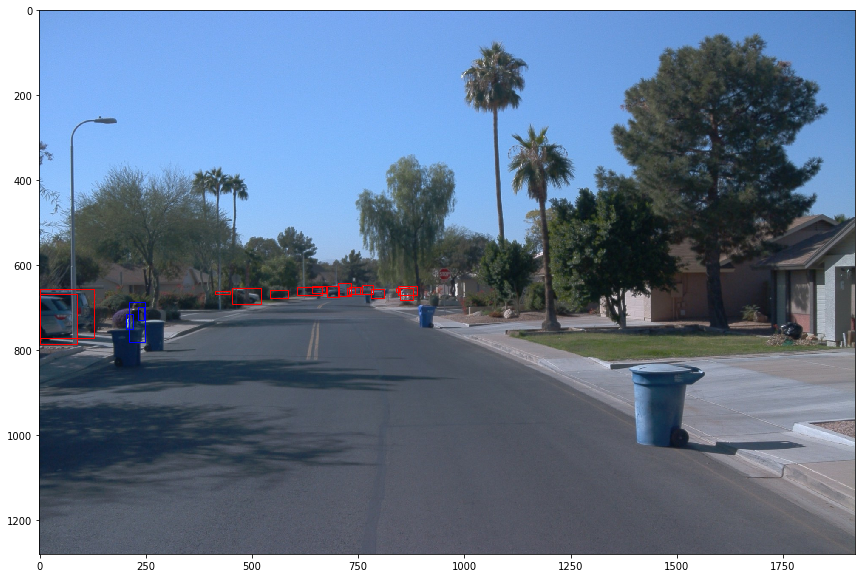

#########################################TFrecord Information#########################################
Name of the TFrecord: b'segment-10444454289801298640_4360_000_4380_000_with_camera_labels_22.tfrecord'
The shape of the image is: (1280, 1920, 3)
The are 46 boxes in the image:
The are 46 objects in the image:


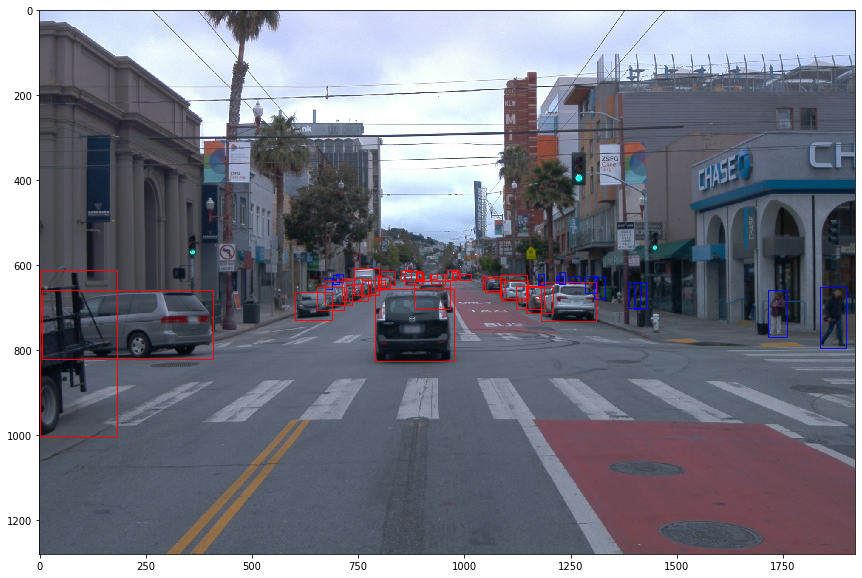

#########################################TFrecord Information#########################################
Name of the TFrecord: b'segment-10975280749486260148_940_000_960_000_with_camera_labels_27.tfrecord'
The shape of the image is: (1280, 1920, 3)
The are 7 boxes in the image:
The are 7 objects in the image:


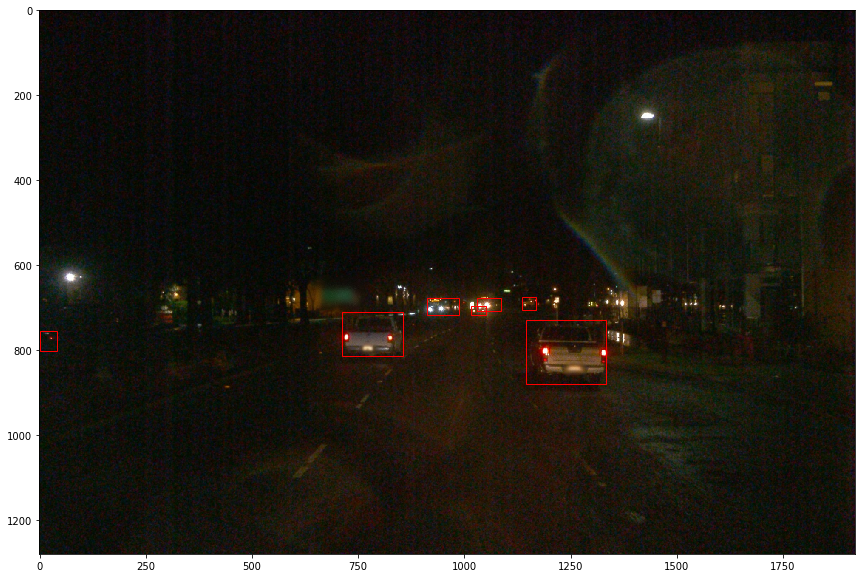

In [5]:
## STUDENT SOLUTION HERE
dataset.shuffle(100)

for batches in dataset.take(10):
    display_instances(batches)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

In [6]:
from collections import Counter

def num_objects(path_tfrecord):
    '''This function counts the number of classes that are present in a tfrecord
       and returns a dic of the classes values
    '''
    # Read the information from a single tfrecord
    raw_dataset = tf.data.TFRecordDataset(path_tfrecord)

    # Initialize Counter of Classes to zero
    count_classes = { 1: 0, 2: 0,  4: 0 }
    
    # Iterate to each element of the tfrecord
    for i, raw_record in enumerate(raw_dataset):
        example = tf.train.Example()
        example.ParseFromString(raw_record.numpy())
        # Iterate to each feature item from the tfrecord
        for k, v in example.features.feature.items():
            # extract the information from the class labels
            if k == 'image/object/class/label':
                values = v.int64_list.value
                count_classes= Counter(count_classes)+ Counter(values)
        frames = i
    return count_classes,frames

In [7]:
import os

# Store the names of all the tfrecord files
entries = os.listdir('../data/processed')

# Variable to store the total number of classes 
num_classes = {1: 0, 2: 0,  4: 0}
num_frames = 0

# Read each TFrecord file and count the number of classes it contains
for name_file in entries:
    count,frames = num_objects('../data/processed/' + name_file)
    # Update the variables
    num_classes  = Counter(num_classes)+ Counter(count)
    num_frames = num_frames + frames
    
# Relevant information about the dataset
print('The number of classes found in the {} tfrecords is: {} vehicles | {} pedestrians | {} cyclists'
      .format(len(entries),num_classes[1],num_classes[2],num_classes[4]))
print('The number of images contained in the tfrecors is: {}'.format(num_frames))

The number of classes found in the 100 tfrecords is: 352694 vehicles | 103664 pedestrians | 2639 cyclists
The number of images contained in the tfrecors is: 19703


### Plot the classes distribution from the dataset

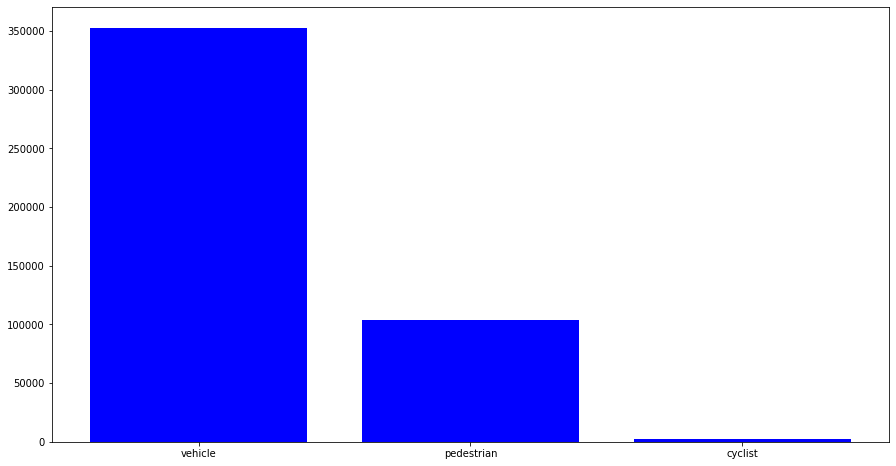

In [8]:
import matplotlib.pyplot as plt

# Mapping the num
mapping = {'vehicle': num_classes[1], 'pedestrian': num_classes[2], 'cyclist': num_classes[4]}

plt.figure(figsize=(15,8))
plt.bar(mapping.keys(), mapping.values(), color='b')
plt.show()